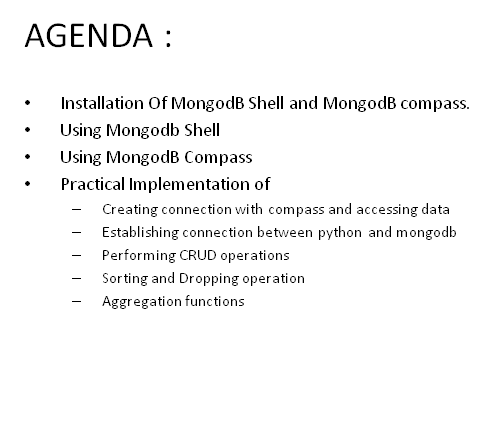

# install pymongo use -> ***!pip install pymongo***

### createmongoclient

In [1]:
from pymongo import MongoClient
democlient = MongoClient()
myclient = MongoClient('localhost',27017)
print(myclient.list_database_names())

['Instore', 'Students', 'admin', 'companyData', 'config', 'demo', 'local', 'shop']


### create db ,collection and inserting files

In [30]:
#Creating new db called demo
mydb = myclient["demo"]
#Creating new collection called dbtable
mycolls=mydb["dbtable"]

In [ ]:
print(myclient.list_database_names())

In [ ]:
record = {
    "id" :0,
    "name" :"Vignesh",
    "address" :"chennai"
}

In [ ]:
#Inserting single record into collection mycolls
mycolls.insert_one(record)

In [ ]:
#Iterating inside collection mycolls
mycolls.find_one({'name':'Vignesh'})

In [ ]:
mylist = [
  { "id": 1, "name": "John", "address": "Highway 37"},
  { "id": 2, "name": "Peter", "address": "Lowstreet 27"},
  { "id": 3, "name": "Amy", "address": "Apple st 652"},
  { "id": 4, "name": "Hannah", "address": "Mountain 21"},
  { "id": 5, "name": "Michael", "address": "Valley 345"},
  { "id": 6, "name": "Sandy", "address": "Ocean blvd 2"},
  { "id": 7, "name": "Betty", "address": "Green Grass 1"},
  { "id": 8, "name": "Richard", "address": "Sky st 331"},
  { "id": 9, "name": "Susan", "address": "One way 98"},
  { "id": 10, "name": "Vicky", "address": "Yellow Garden 2"},
  { "id": 11, "name": "Ben", "address": "Park Lane 38"},
  { "id": 12, "name": "William", "address": "Central st 954"},
  { "id": 13, "name": "Chuck", "address": "Main Road 989"},
  { "id": 14, "name": "Viola", "address": "Sideway 1633"}
]

In [ ]:
#Performing inserting many operation inside collection mycolls
x = mycolls.insert_many(mylist)

In [ ]:
#Iterating inside collection mycolls
mycolls.find_one({'id':12})

In [ ]:
## Simple way of querying
mycolls.find_one()

In [ ]:
## Select * from employeeinformation
for x in mycolls.find(): #for finding all occurences in collection find({})
    print(x)

In [ ]:
## Query the json documents based on equality conditions
# Select * from employeeinformation where firstname=Viols

for record in mycolls.find({'name':'Viola'}):
    print(record)

In [ ]:
empinfo=mydb.employeeinformation

In [ ]:
records=[{
        'firstname':'John',
        'lastname':'Doe',
        'department':'Analytics',
        'qualification':'statistics',
        'age':35
        
        },
         {
        'firstname':'John ',
        'lastname':'Smith',
        'department':'Analytics',
        'qualification':'masters',
        'age':30
        
        },
        {
        'firstname':'Manish',
        'lastname':'Sen',
        'department':'Analytics',
        'qualification':'phd',
        'age':34
        
        },
        {
        'firstname':'Ram',
        'lastname':'Singh',
        'department':'Analytics',
        'qualification':'master',
        'age':32
        
        }]

In [ ]:
#Creating new collection
empinfo.insert_many(records)

### Aggregation functions 

- $in , $lt, $gt
- and
- or

In [ ]:
## Query documents using query operators($in,$lt,$gt)
for record in empinfo.find({'qualification':{'$in':['phd','master']}}):
    print(record)

In [ ]:
## And and Query operators
for record in empinfo.find({'$and':[{'firstname':'Ram'},{'qualification':'master'}]}):
    print(record)

In [ ]:
## OR operators
for record in empinfo.find({'$or':[{'firstname':'Ram'},{'qualification':'master'}]}):
    print(record)

In [ ]:
empinfo.find({'$or':[{'firstname':'Ram'},{'qualification':'master'}]})

In [ ]:
#Creating new collection called inventorys
my_inventorys =mydb["inventorys"]

In [ ]:
#Creating nested records
my_inventorys.insert_many( [
   { 'item': "journal", 'qty': 25, 'size': { 'h': 14, 'w': 21,'uom': "cm" }, 'status': "A" },
   { 'item': "notebook", 'qty': 50,'size': { 'h': 8.5, 'w': 11,'uom': "in" },'status': "A" },
   { 'item': "paper", 'qty': 100, 'size': { 'h': 8.5, 'w': 11,'uom': "in" },'status': "D" },
   { 'item': "planner", 'qty': 75, 'size': { 'h': 22.85,'w': 30,'uom': "cm" },'status': "D" },
   { 'item': "postcard", 'qty': 45, 'size': { 'h': 10, 'w': 15.25,'uom': "cm" },'status': "A" }
]);

In [ ]:
for records in my_inventorys.find({'item': "journal"}):
    print(records)  

In [ ]:
for records in my_inventorys.find({'size': { 'h': 14, 'w': 21,'uom': "cm" }}):
    print(records)  

### Update Querey

- pymongo.collection.Collection.update_one()
- pymongo.collection.Collection.update_many()
- pymongo.collection.Collection.replace_one()

In [ ]:
my_inventorys.update_one()

In [ ]:
my_inventorys.update_one(
{"item":"paper"},
{"$set":{"size.uom":"mmm","status":"P"},
"$currentDate":{"lastModified":True}}
)

In [ ]:
for records in my_inventorys.find({'item': 'paper'}):
    print(records)

In [ ]:
my_inventorys.update_many(
    {"qty": {"$lt": 50}},
    {"$set": {"size.uom": "in", "status": "P"},
     "$currentDate": {"lastModified": True}})

In [ ]:
my_inventorys.replace_one()

{ 'item': "paper", 'qty': 100, 'size': { 'h': 8.5, 'w': 11,'uom': "in" },'status': "D" }

In [ ]:
my_inventorys.replace_one(
    {"item": "paper"},
    {"item": "paper",
     "instock": [
         {"warehouse": "A", "qty": 60},
         {"warehouse": "B", "qty": 40}]})

### Sorting

In [ ]:
mydoc_A=mycolls.find().sort('name',1)  #ascending   #sorting data in aplhabetical order
mydoc_D=mycolls.find().sort('name',-1)  #descending 

In [ ]:
for x in mydoc_A:
    print(x)

### delete query

In [ ]:
myquery={"name":"Sandy"}

In [ ]:
#mydoc=mycolls.delete_many(myquery)  #deleting multiple records 
mydoc=mycolls.delete_one(myquery)   #deleting specific single record
for y in mycolls.find():
    print(y)

### drop 

In [ ]:
#mycolls.drop()   #drop collection
myclient.drop_database("demo")   #for droping the db
print(myclient.list_database_names())

### Accessing Structured Data

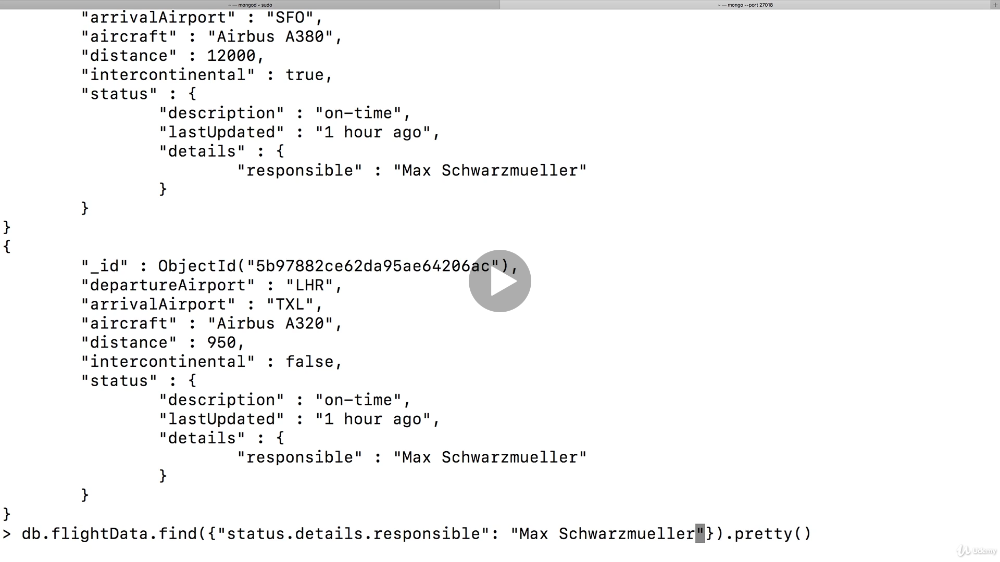

### 3. Schemas & Relations: How to Structure Documents

### Creating new collection for flights data

In [ ]:
#Creating new collection called dbtable
mycollection =mydb["flightDatas"]

In [ ]:
mylistdatas = [
  {
    "name": "Max Schwarzmueller",
    "age": 29
  },
  {
    "name": "Manu Lorenz",
    "age": 30
  },
  {
    "name": "Chris Hayton",
    "age": 35
  },
  {
    "name": "Sandeep Kumar",
    "age": 28
  },
  {
    "name": "Maria Jones",
    "age": 30
  },
  {
    "name": "Alexandra Maier",
    "age": 27
  },
  {
    "name": "Dr. Phil Evans",
    "age": 47
  },
  {
    "name": "Sandra Brugge",
    "age": 33
  },
  {
    "name": "Elisabeth Mayr",
    "age": 29
  },
  {
    "name": "Frank Cube",
    "age": 41
  },
  {
    "name": "Karandeep Alun",
    "age": 48
  },
  {
    "name": "Michaela Drayer",
    "age": 39
  },
  {
    "name": "Bernd Hoftstadt",
    "age": 22
  },
  {
    "name": "Scott Tolib",
    "age": 44
  },
  {
    "name": "Freddy Melver",
    "age": 41
  },
  {
    "name": "Alexis Bohed",
    "age": 35
  },
  {
    "name": "Melanie Palace",
    "age": 27
  },
  {
    "name": "Armin Glutch",
    "age": 35
  },
  {
    "name": "Klaus Arber",
    "age": 53
  },
  {
    "name": "Albert Twostone",
    "age": 68
  },
  {
    "name": "Gordon Black",
    "age": 38
  }
]

In [ ]:
Flightdata = mycollection.insert_many(mylistdatas)

In [ ]:
for x in mycollection.find({'age': 30}):
    print(x)

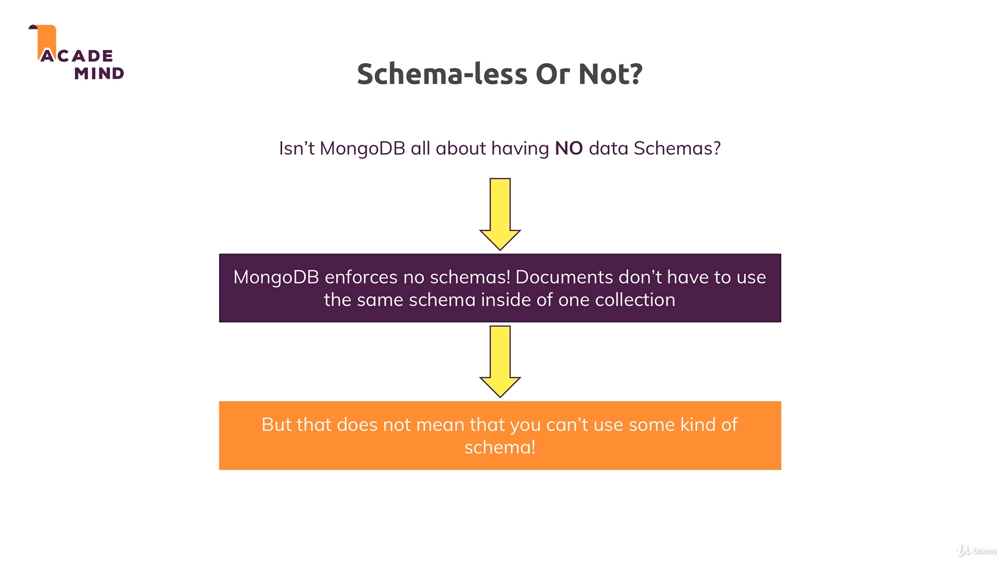

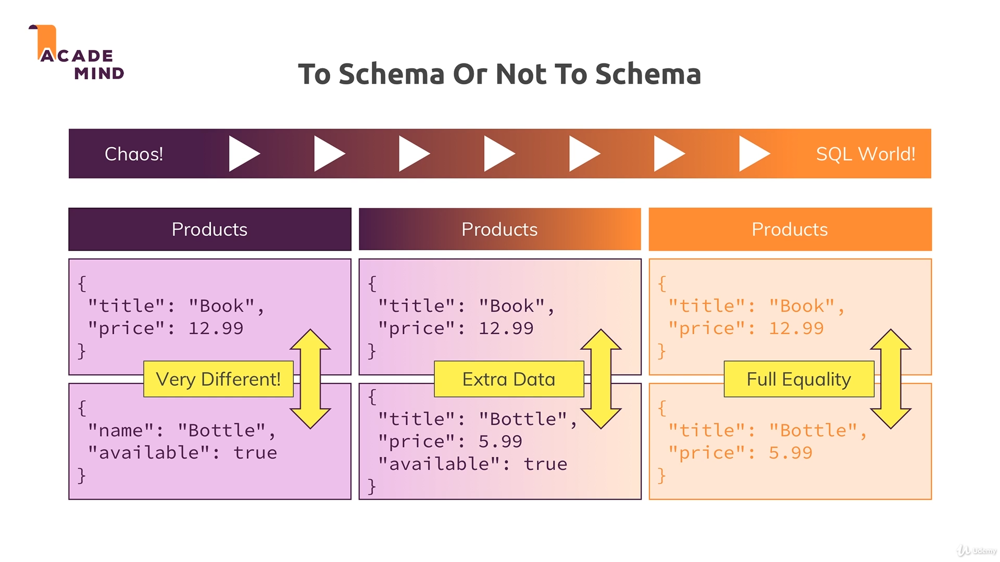

In [ ]:
y = mydb.products

In [ ]:
y.insert_one({
    'name' : 'A book',
    'price' : 12.99
})

In [ ]:
y.insert_one({
    'name' : 'T-Shirt',
    'price' : 22.99,
    'Available' : 'yes'
})

In [ ]:
y.insert_one({
    'name' : 'Computer',
    'price' : 2222.99,
    'Available' : 'yes',
    'details': {
        'processor' : 'Intel i7 8770',
        'RAM' : 42
    }
})

In [ ]:
y.insert_one({
    'name' : 'Computer',
    'price' : 2222.99,
    'Available' : 'no',
    'details': {
        'processor' : 'Intel i4 8770',
        'RAM' : 24
    }
})

In [ ]:
for i in y.find({}):
    print(i)

In [ ]:
y.delete_one({'Available':'no'})

# Data Types

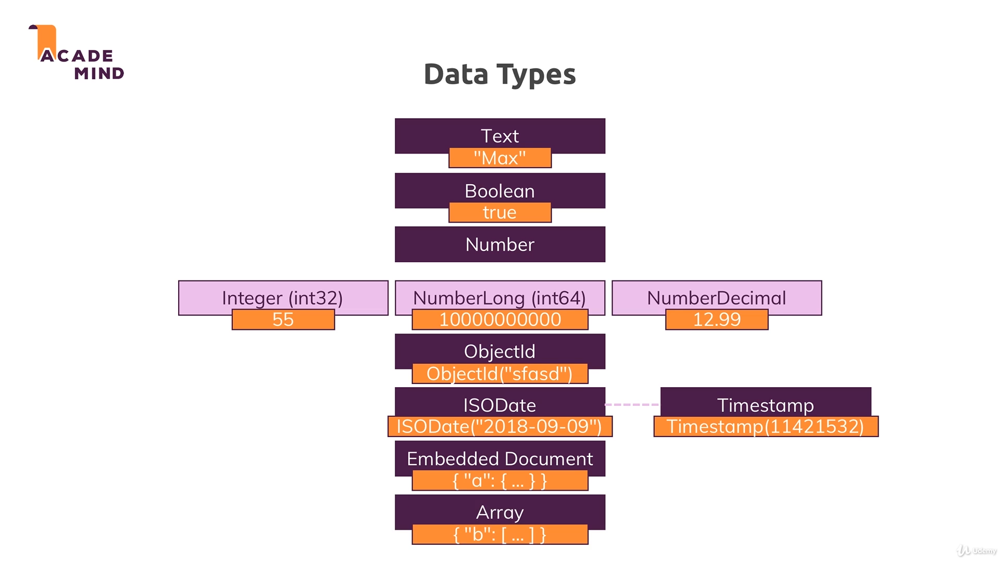

In [ ]:
#Creating new db called demo
mydb1 = myclient["companyData"]
#Creating new collection called dbtable
mycollS=mydb1["companies"]

In [ ]:
from datetime import date

In [ ]:
d = date.today()

In [ ]:
mycollS.insert_one({
    'name':'Fresh Apple Inc',
    'isStartup': True,
    'employees':33,
    'funding':12345678912,
    'details':{
        'ceo':'vignesh',
        'qualification': 'B.E'
    },
    'tags':[
        {
            'title':'Mr',
        },
        {
            'titles':'Perfect'
        }
    ],
    'foundingDate' :"$currentDate",
    'insertedat' :d.strftime("%d/%m/%y") 
})

#javascript doesnt differenitate between integers and floating point numbers

In [ ]:
for i in mycollS.find({}):
    print(i)

### Data Schemas and Data Modeling

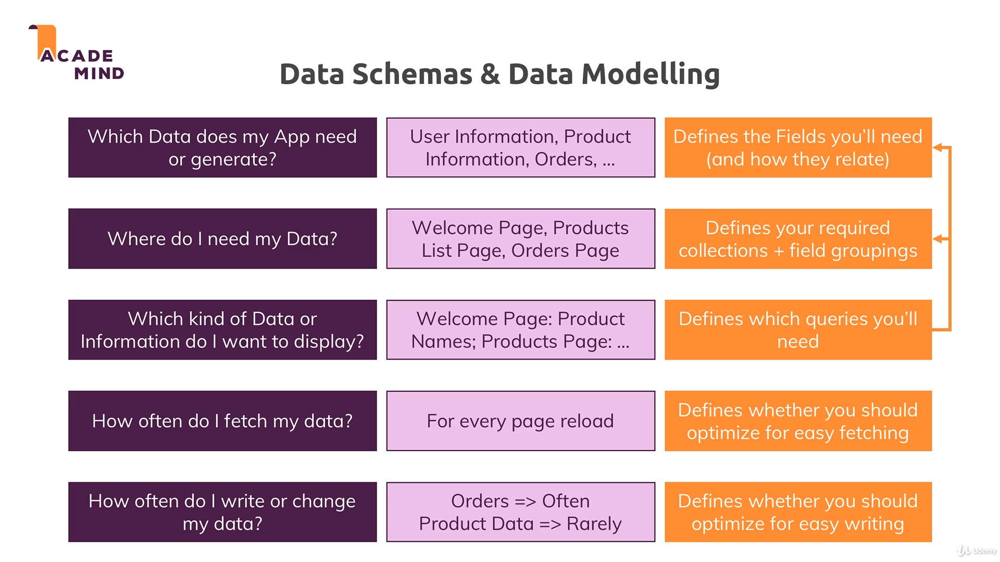

### Relations (Multiple collections)

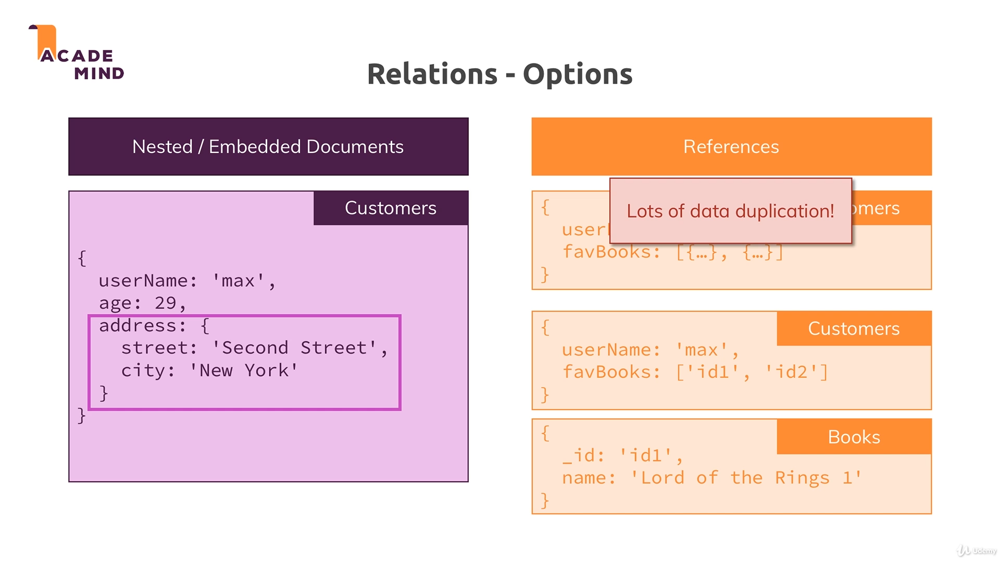

### One to One relations - Embedded
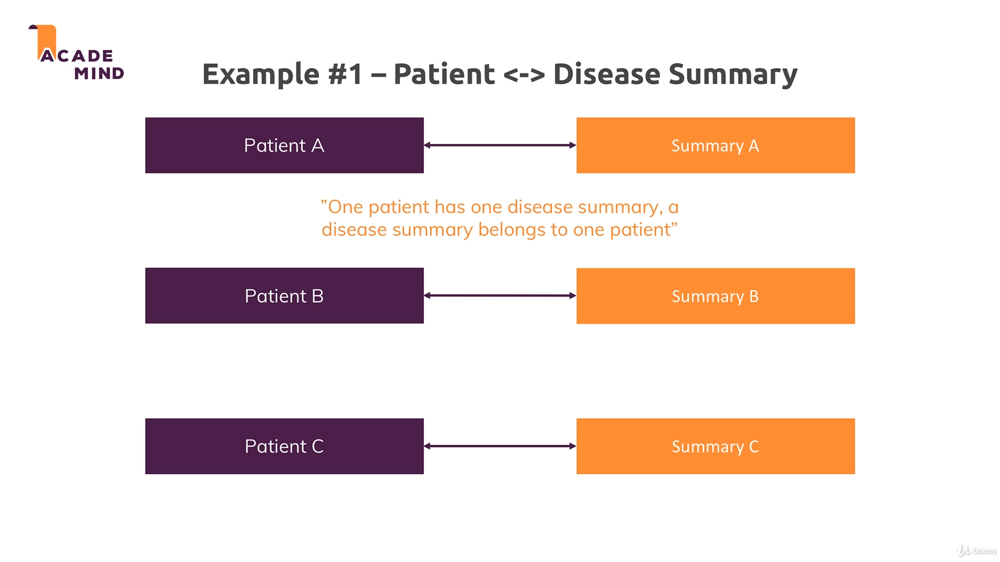

In [ ]:
#Creating new collection called dbtable
mycolls_Hosp =mydb["Hospital"]
#Creating new collection called dbtable
colls_Diseases =mydb["Disease"]

In [ ]:
mycolls_Hosp.insert_one({
    'name':'EPS',
    'age':55,
    'diseaseSummary' :'summary_eps_1'
})

In [ ]:
mycolls_Hosp.find_one({})

In [ ]:
colls_Diseases.insert_one({
    '_id' :'summary_eps_1',
    'diseases' :['cold','broken heart','heart']
})

In [ ]:
dsid = mycolls_Hosp.find_one({})['diseaseSummary']
dsid

In [ ]:
colls_Diseases.find_one({'_id':dsid})

### One to One Reference

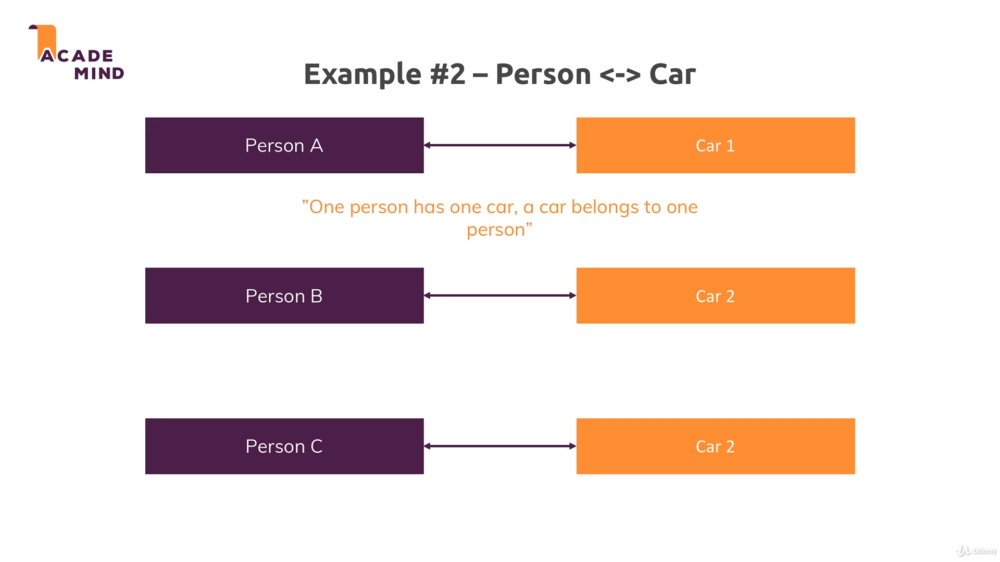

### One to many Embedded
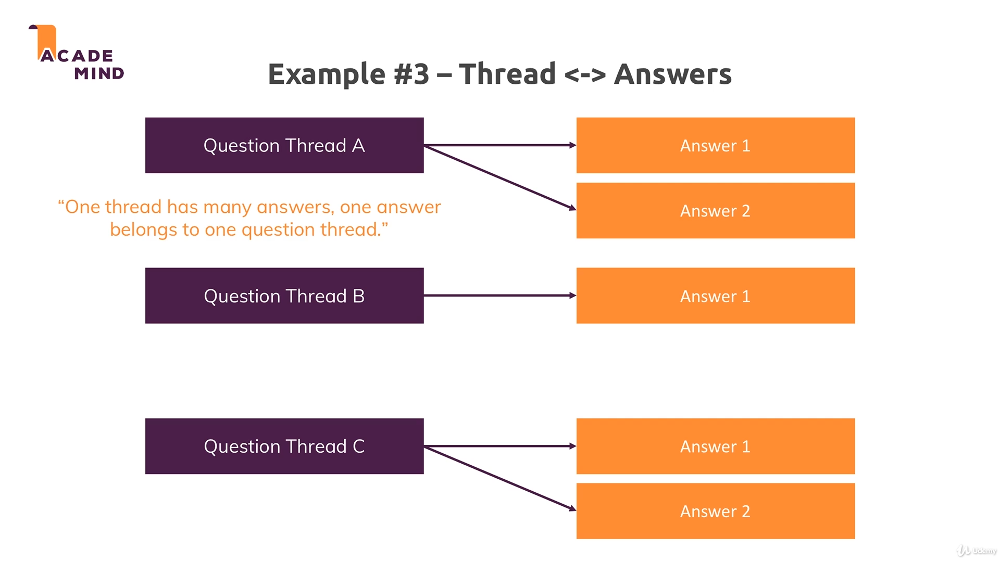

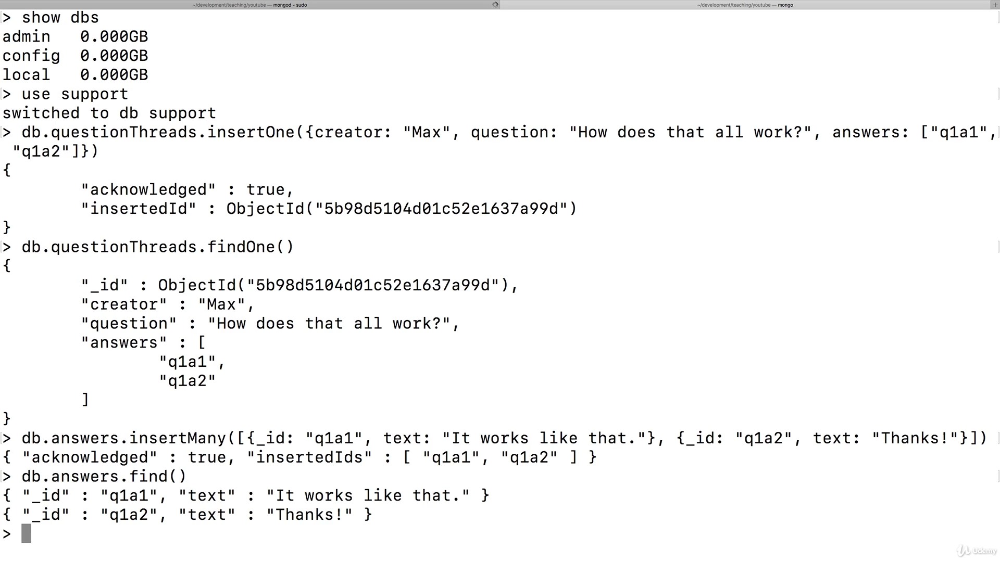

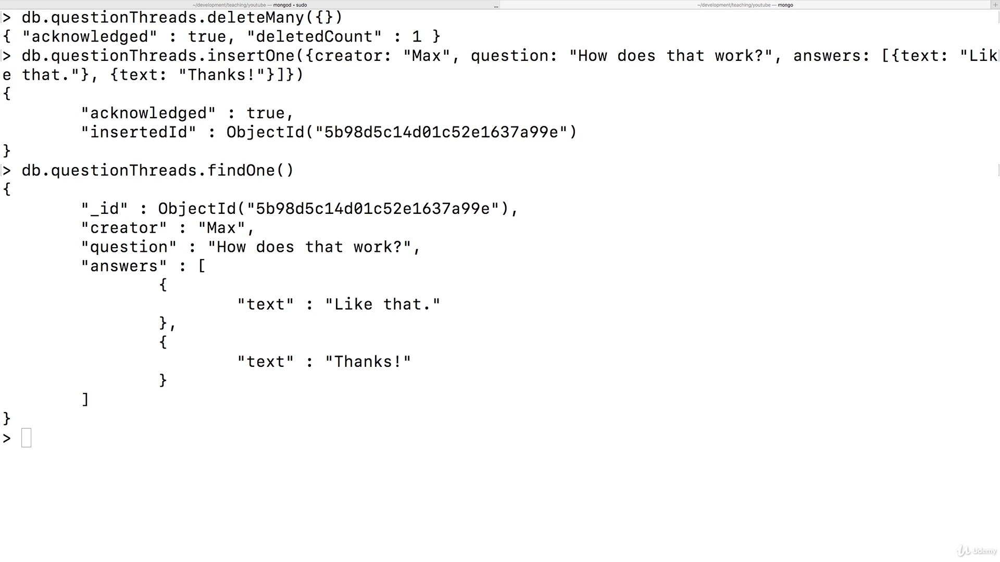

### One to many reference
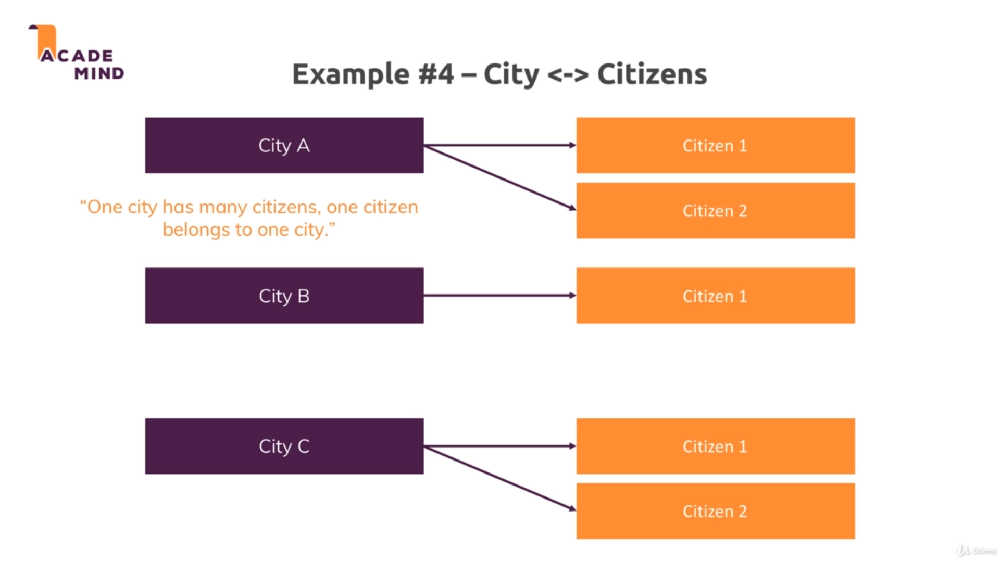

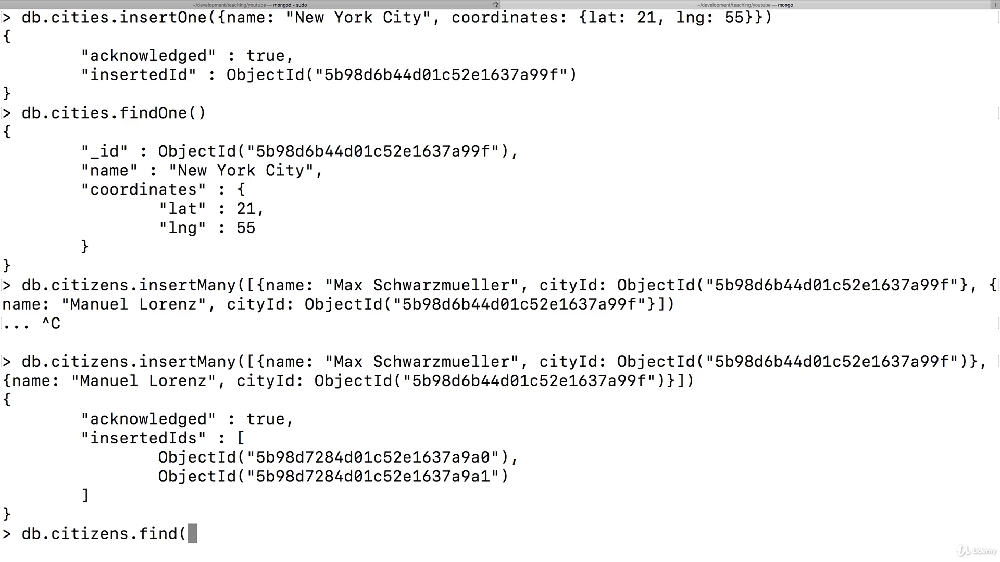

### Many to Many Embedded

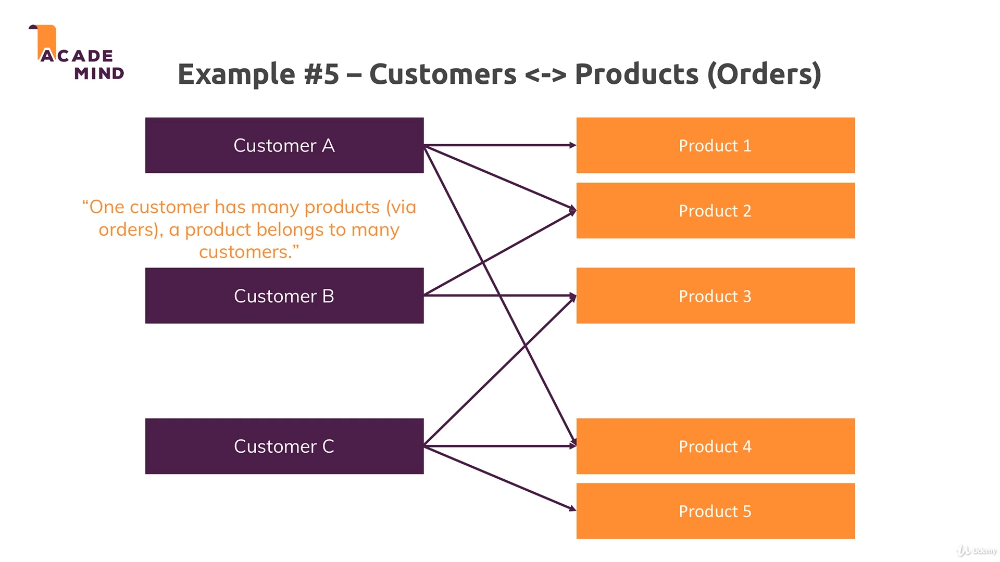

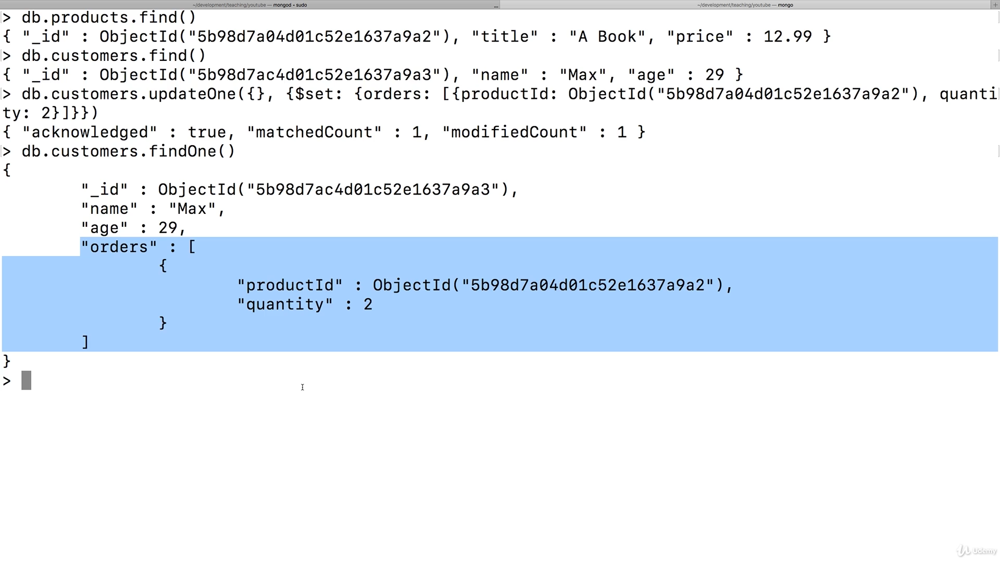

### Many to Many Using references
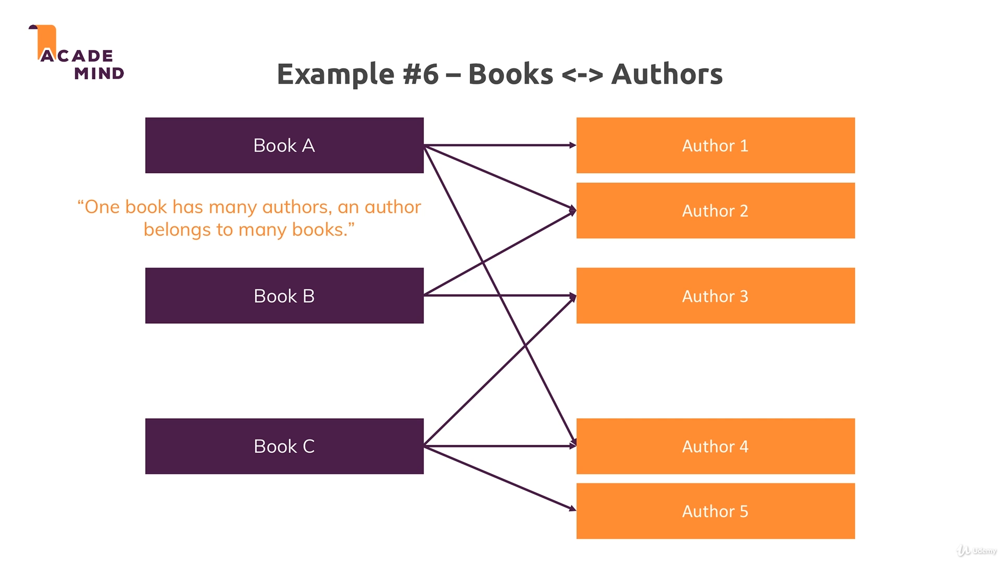

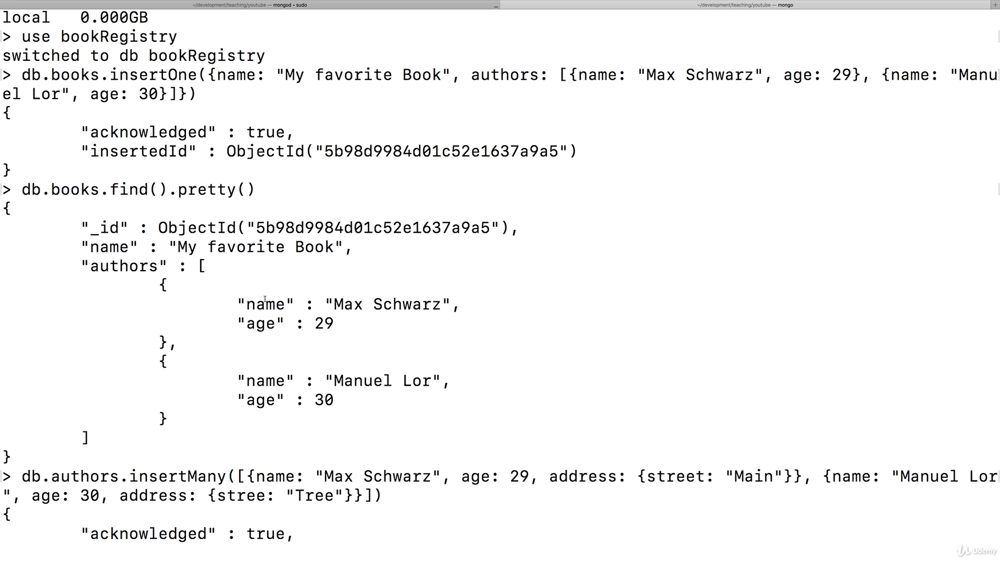

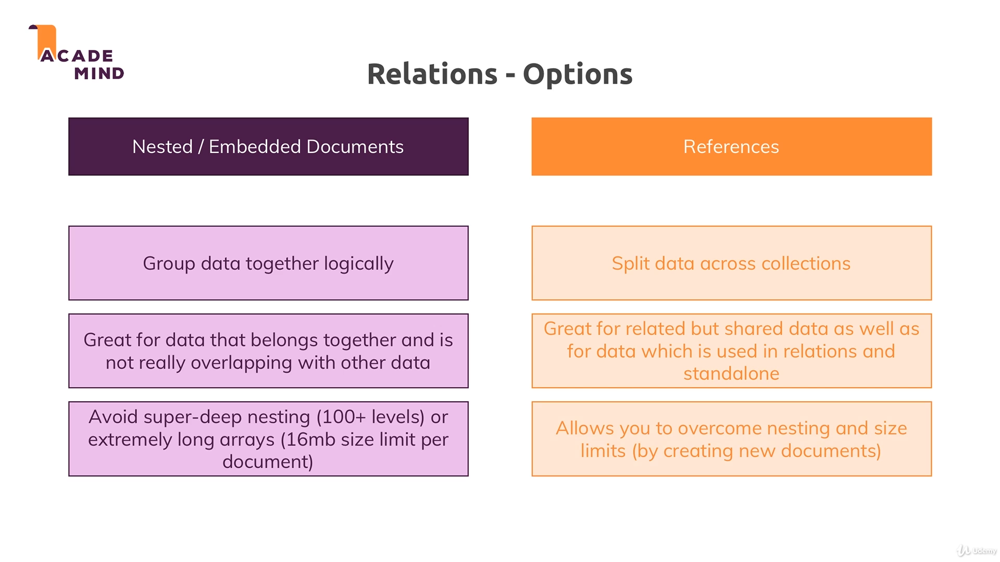

# Using "lookUp()" for Merging Reference Relations

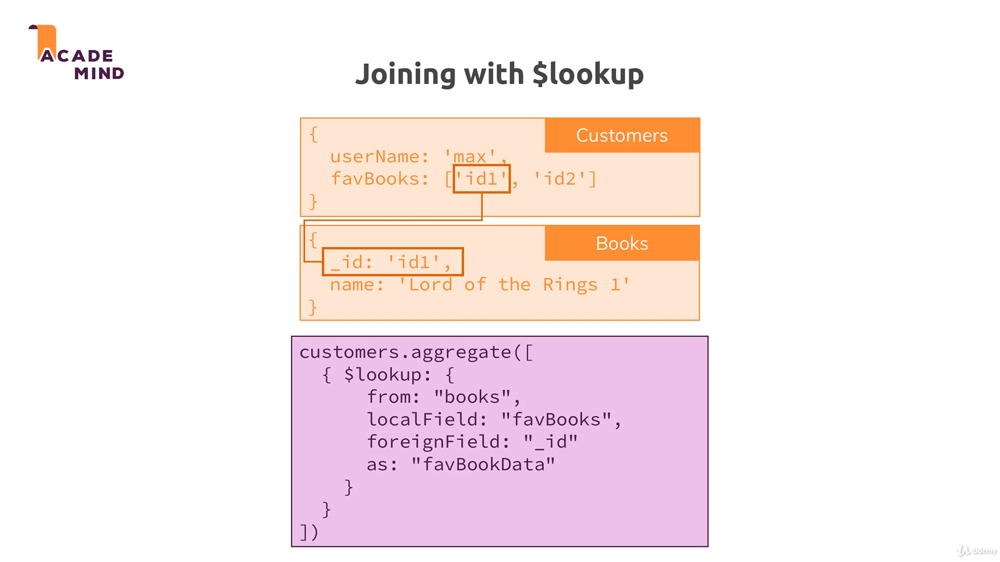

### Example DataArchitecture

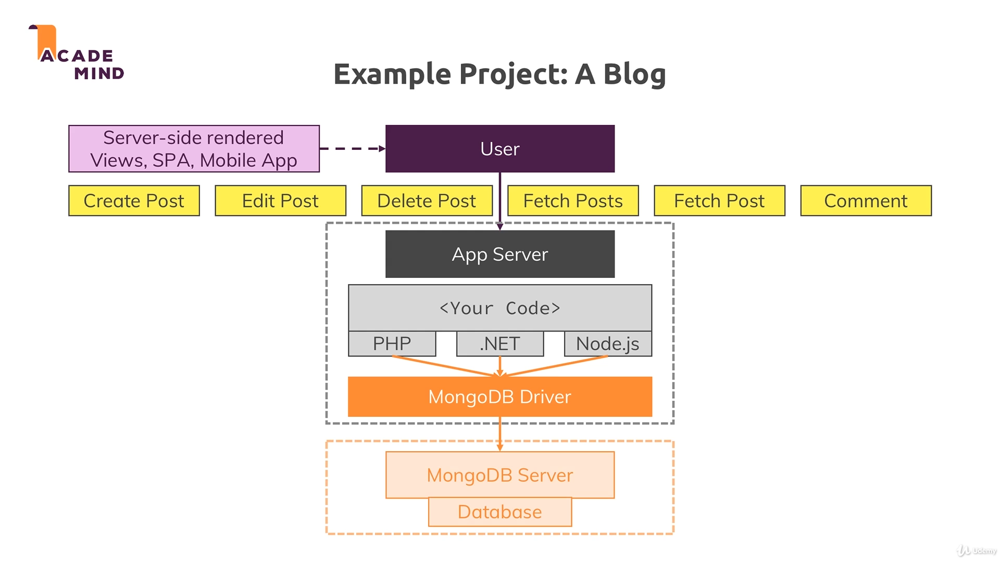

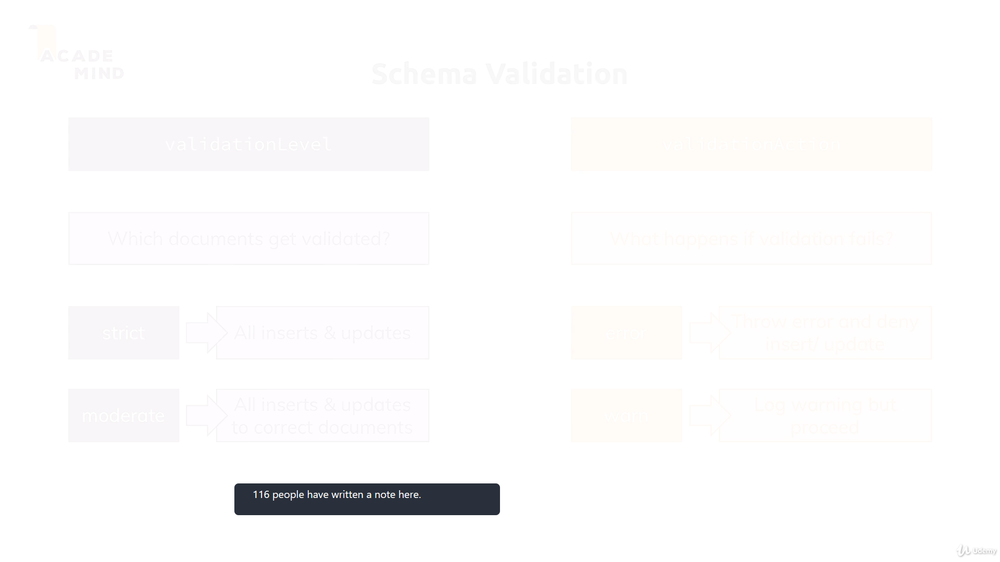

----


# Mongodb Aggregate And Group

    avg
    sum
    project



In [7]:
# Access database  
mydatabase = myclient['Students']  
    
# Access collection of the database  
collection=mydatabase['studentscores']  

In [8]:

data = [ 
    {"user":"Krish", "subject":"Database", "score":80}, 
    {"user":"Amit",  "subject":"JavaScript", "score":90}, 
    {"user":"Amit",  "subject":"Database", "score":85}, 
    {"user":"Krish",  "subject":"JavaScript", "score":75},
    {"user":"vignesh",  "subject":"JavaScript", "score":75},
    {"user":"Amit",  "subject":"Data Science", "score":60},
    {"user":"vignesh",  "subject":"Data Science", "score":60},
    {"user":"Krish",  "subject":"Data Science", "score":95}] 
  
collection.insert_many(data)

In [9]:
### Find Amit And Krish Total Subjects
agg_result= collection.aggregate( 
    [{ 
    "$group" :  
        {"_id" : "$user",  
         "Total Subject" : {"$sum" : 1} 
         }} 
    ])

In [10]:
for i in agg_result: 
    print(i)

{'_id': 'vignesh', 'Total Subject': 2}
{'_id': 'Krish', 'Total Subject': 3}
{'_id': 'Amit', 'Total Subject': 3}


In [11]:
### Calculating the total score based on user
agg_result= collection.aggregate( 
    [{ 
    "$group" :  
        {"_id" : "$user",  
         "Total Marks" : {"$sum" :"$score"} 
         }} 
    ]) 
for i in agg_result: 
    print(i)

{'_id': 'vignesh', 'Total Marks': 135}
{'_id': 'Krish', 'Total Marks': 250}
{'_id': 'Amit', 'Total Marks': 235}


In [12]:
### Calculating the average score based on user
agg_result=collection.aggregate([
   {
      "$group": {
         "_id": '$user',
         "StudentScoreAverage": {
            "$avg": "$score"
         }
      }
   }
])
for i in agg_result: 
    print(i)

{'_id': 'vignesh', 'StudentScoreAverage': 67.5}
{'_id': 'Amit', 'StudentScoreAverage': 78.33333333333333}
{'_id': 'Krish', 'StudentScoreAverage': 83.33333333333333}


In [20]:
import datetime as datetime

In [21]:
### Create a new collection
data=[{ "_id" : 1, "item" : "abc", "price" : 10, "quantity" : 2, "date" : datetime.datetime.utcnow()},
{ "_id" : 2, "item" : "jkl", "price" : 20, "quantity" : 1, "date" : datetime.datetime.utcnow() },
{ "_id" : 3, "item" : "xyz", "price" : 5, "quantity" : 5, "date" : datetime.datetime.utcnow() },
{ "_id" : 4, "item" : "abc", "price" : 10, "quantity" : 10, "date" : datetime.datetime.utcnow() },
{ "_id" : 5, "item" : "xyz", "price" : 5, "quantity" : 10, "date" :datetime.datetime.utcnow() }]

In [32]:
#Creating new collection called dbtable
mycollec=mydb["dbtable"]

In [33]:
mycollec.insert_many(data)

In [34]:
### Calculating the average quantity And Average Price
agg_result=mycollec.aggregate([
   {
      "$group": {
         "_id": '$item',
         "avgAmount": {"$avg": {"$multiply": [ "$price", "$quantity" ]}},
          "avgQuantity": { "$avg": "$quantity" }
      }
   }
])
for i in agg_result: 
    print(i)

{'_id': 'jkl', 'avgAmount': 20.0, 'avgQuantity': 1.0}
{'_id': 'abc', 'avgAmount': 60.0, 'avgQuantity': 6.0}
{'_id': 'xyz', 'avgAmount': 37.5, 'avgQuantity': 7.5}


In [35]:
#### $Project

data=[{
  "_id" : 1,
  "title": "abc123",
  "isbn": "0001122223334",
  "author": { "last": "zzz", "first": "aaa" },
  "copies": 5
},
{
  "_id" : 2,
  "title": "Baked Goods",
  "isbn": "9999999999999",
  "author": { "last": "xyz", "first": "abc", "middle": "" },
  "copies": 2
}
]

In [37]:
# Access collection of the database  
collection=mydb['Books']

In [38]:
collection.insert_many(data)

In [39]:
for i in collection.find():
    print(i
         )

{'_id': 1, 'title': 'abc123', 'isbn': '0001122223334', 'author': {'last': 'zzz', 'first': 'aaa'}, 'copies': 5}
{'_id': 2, 'title': 'Baked Goods', 'isbn': '9999999999999', 'author': {'last': 'xyz', 'first': 'abc', 'middle': ''}, 'copies': 2}


In [40]:
for row in collection.aggregate( [ { "$project": { "title": 1,"isbn":1 } } ] ):
    print(row)

{'_id': 1, 'title': 'abc123', 'isbn': '0001122223334'}
{'_id': 2, 'title': 'Baked Goods', 'isbn': '9999999999999'}
